<a href="https://colab.research.google.com/github/sg3045/zemi/blob/main/saisyuukadai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Using Colab cache for faster access to the 'gtzan-dataset-music-genre-classification' dataset.
使用するファイル: /kaggle/input/gtzan-dataset-music-genre-classification/Data/genres_original/rock/rock.00073.wav


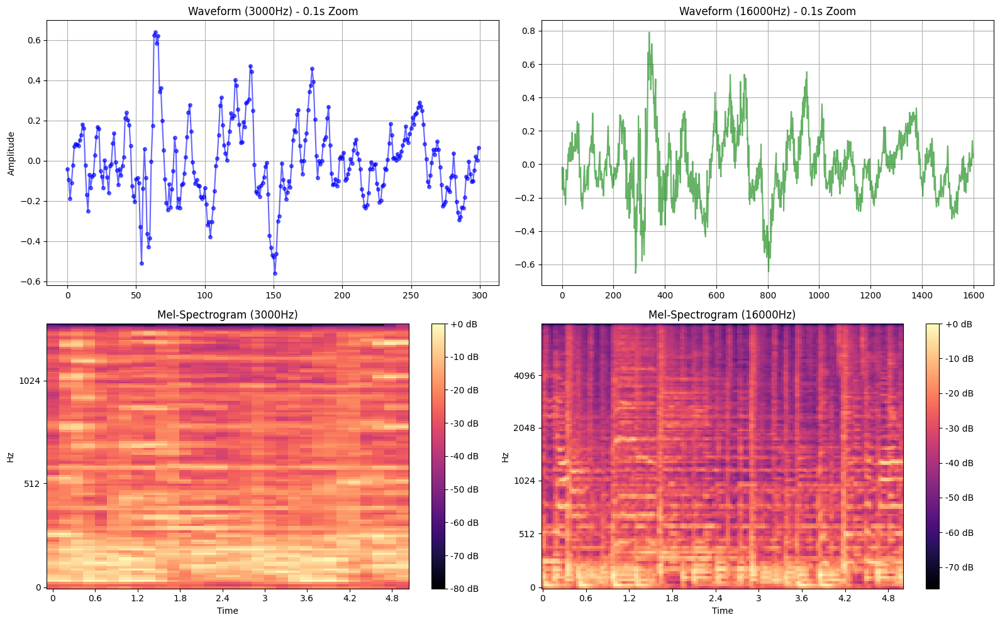

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import kagglehub
from pathlib import Path

# 1. データの場所を再特定
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")
data_path = Path(path) / 'Data'/ 'genres_original'

# 2. ロックの1曲目をサンプルとして取得
# (filesがないと言われたので、ここで直接ファイルパスを作ります)
sample_file = str(list(data_path.glob("rock/*.wav"))[0])
print(f"使用するファイル: {sample_file}")

def plot_sr_comparison(file_path):
    # 低解像度 (3000Hz) と 高解像度 (16000Hz) で読み込み
    y_3k, _ = librosa.load(file_path, sr=3000, duration=5)
    y_16k, _ = librosa.load(file_path, sr=16000, duration=5)

    plt.figure(figsize=(16, 10))

    # --- 1. 波形 (Waveform) の比較 ---
    # 0.1秒間をズームして、サンプルの「粒」の見え方を比較
    time_span = 0.1
    samples_3k = int(3000 * time_span)
    samples_16k = int(16000 * time_span)

    # 3000Hzの波形 (カクカクしているはず)
    plt.subplot(2, 2, 1)
    plt.plot(y_3k[:samples_3k], marker='o', markersize=4, linestyle='-', color='blue', alpha=0.6)
    plt.title("Waveform (3000Hz) - 0.1s Zoom")
    plt.ylabel("Amplitude")
    plt.grid(True)

    # 16000Hzの波形 (滑らかなはず)
    plt.subplot(2, 2, 2)
    plt.plot(y_16k[:samples_16k], color='green', alpha=0.6)
    plt.title("Waveform (16000Hz) - 0.1s Zoom")
    plt.grid(True)

    # --- 2. スペクトログラムの比較 ---
    # 3000Hz
    plt.subplot(2, 2, 3)
    S_3k = librosa.feature.melspectrogram(y=y_3k, sr=3000, n_mels=128)
    librosa.display.specshow(librosa.power_to_db(S_3k, ref=np.max),
                             sr=3000, x_axis='time', y_axis='mel', fmax=1500)
    plt.title("Mel-Spectrogram (3000Hz)")
    plt.colorbar(format='%+2.0f dB')

    # 16000Hz
    plt.subplot(2, 2, 4)
    S_16k = librosa.feature.melspectrogram(y=y_16k, sr=16000, n_mels=128)
    librosa.display.specshow(librosa.power_to_db(S_16k, ref=np.max),
                             sr=16000, x_axis='time', y_axis='mel', fmax=8000)
    plt.title("Mel-Spectrogram (16000Hz)")
    plt.colorbar(format='%+2.0f dB')

    plt.tight_layout()
    plt.show()

plot_sr_comparison(sample_file)

データをダウンロード・準備中...
Using Colab cache for faster access to the 'gtzan-dataset-music-genre-classification' dataset.

--- 1D-CNN 学習開始 (5 Epoch) ---
Epoch 1, Loss: 2.2777
Epoch 2, Loss: 2.1979
Epoch 3, Loss: 2.1228
Epoch 4, Loss: 2.0487
Epoch 5, Loss: 1.9893

### 1D-CNN 正答率レポート ###
              precision    recall  f1-score   support

       blues       0.00      0.00      0.00        20
   classical       0.62      0.80      0.70        20
     country       0.22      0.55      0.31        20
       disco       0.00      0.00      0.00        20
      hiphop       0.00      0.00      0.00        20
        jazz       0.23      0.35      0.28        20
       metal       0.00      0.00      0.00        20
         pop       0.22      0.75      0.34        20
      reggae       0.41      0.35      0.38        20
        rock       0.25      0.10      0.14        20

    accuracy                           0.29       200
   macro avg       0.20      0.29      0.22       200
weighted avg      

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


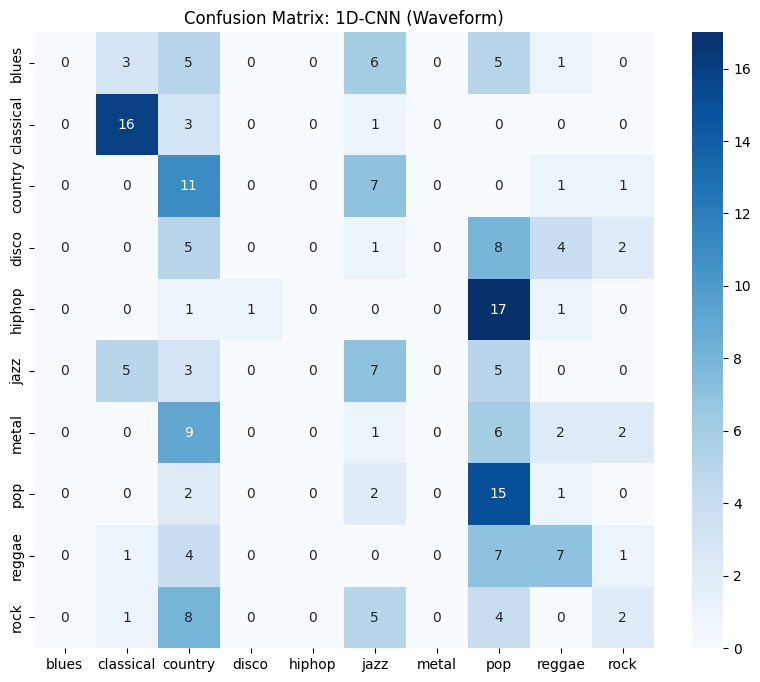

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchaudio.transforms as T
import librosa
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from torch.utils.data import Dataset, DataLoader, Subset
import kagglehub

# ==========================================
# 1. データのダウンロードと分割 (全自動)
# ==========================================
print("データをダウンロード・準備中...")
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")
data_path = Path(path) / 'Data'/ 'genres_original'

GENRES = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
TARGET_SR = 16000

# ファイルリスト作成
all_f, all_l = [], []
for g in GENRES:
    genre_dir = data_path / g
    for wav in genre_dir.glob("*.wav"):
        if wav.name == "jazz.00054.wav": continue # 破損ファイル
        all_f.append(str(wav))
        all_l.append(GENRES.index(g))

# 8:2に分割
tr_i, te_i = train_test_split(np.arange(len(all_l)), test_size=0.2, stratify=all_l, random_state=42)

# ==========================================
# 2. クラス定義 (Dataset & 1D-CNN)
# ==========================================
class GTZANDataset(Dataset):
    def __init__(self, files, labels, sr):
        self.files, self.labels, self.sr = files, labels, sr
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        wav, _ = librosa.load(self.files[idx], sr=self.sr, duration=30)
        wav = torch.tensor(wav).unsqueeze(0)
        target_len = self.sr * 30
        if wav.size(1) > target_len:
            wav = wav[:, :target_len]
        else:
            wav = torch.nn.functional.pad(wav, (0, target_len - wav.size(1)))
        return wav, self.labels[idx]

class Audio1DCNN(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=64, stride=16), nn.ReLU(), nn.MaxPool1d(4),
            nn.Conv1d(16, 32, kernel_size=32, stride=8), nn.ReLU(), nn.MaxPool1d(4),
            nn.AdaptiveAvgPool1d(1)
        )
        self.classifier = nn.Linear(32, num_classes)
    def forward(self, x):
        return self.classifier(self.features(x).view(x.size(0), -1))

# ==========================================
# 3. 学習の実行
# ==========================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
full_dataset = GTZANDataset(all_f, all_l, TARGET_SR)
train_loader = DataLoader(Subset(full_dataset, tr_i), batch_size=16, shuffle=True)
test_loader = DataLoader(Subset(full_dataset, te_i), batch_size=16, shuffle=False)

model_1d = Audio1DCNN(num_classes=10).to(device)
optimizer = optim.Adam(model_1d.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

print("\n--- 1D-CNN 学習開始 (5 Epoch) ---")
for epoch in range(5):
    model_1d.train()
    loss_val = 0.0
    for wave, labels in train_loader:
        wave, labels = wave.to(device), labels.to(device)
        optimizer.zero_grad()
        loss = criterion(model_1d(wave), labels)
        loss.backward(); optimizer.step()
        loss_val += loss.item()
    print(f"Epoch {epoch+1}, Loss: {loss_val/len(train_loader):.4f}")

# ==========================================
# 4. 評価と混同行列の表示
# ==========================================
model_1d.eval()
all_p, all_l_test = [], []
with torch.no_grad():
    for wave, labels in test_loader:
        _, p = torch.max(model_1d(wave.to(device)), 1)
        all_p.extend(p.cpu().numpy()); all_l_test.extend(labels.numpy())

print("\n### 1D-CNN 正答率レポート ###")
print(classification_report(all_l_test, all_p, target_names=GENRES))

plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(all_l_test, all_p), annot=True, fmt='d', xticklabels=GENRES, yticklabels=GENRES, cmap='Blues')
plt.title("Confusion Matrix: 1D-CNN (Waveform)")
plt.show()

データを準備中...
Using Colab cache for faster access to the 'gtzan-dataset-music-genre-classification' dataset.

--- 強化版1D-CNN 学習開始 (デバイス: cuda) ---
Epoch 1/20, Loss: 2.1653
Epoch 2/20, Loss: 1.9896
Epoch 3/20, Loss: 1.8467
Epoch 4/20, Loss: 1.7762
Epoch 5/20, Loss: 1.7012
Epoch 6/20, Loss: 1.6719
Epoch 7/20, Loss: 1.5726
Epoch 8/20, Loss: 1.5088
Epoch 9/20, Loss: 1.5039
Epoch 10/20, Loss: 1.4787
Epoch 11/20, Loss: 1.5010
Epoch 12/20, Loss: 1.4670
Epoch 13/20, Loss: 1.4080
Epoch 14/20, Loss: 1.3875
Epoch 15/20, Loss: 1.3665
Epoch 16/20, Loss: 1.3572
Epoch 17/20, Loss: 1.3180
Epoch 18/20, Loss: 1.2979
Epoch 19/20, Loss: 1.2831
Epoch 20/20, Loss: 1.3013

### 強化版1D-CNN 識別結果レポート ###
              precision    recall  f1-score   support

       blues       1.00      0.35      0.52        20
   classical       0.62      0.80      0.70        20
     country       0.80      0.20      0.32        20
       disco       0.35      0.80      0.48        20
      hiphop       0.40      0.40      0.40    

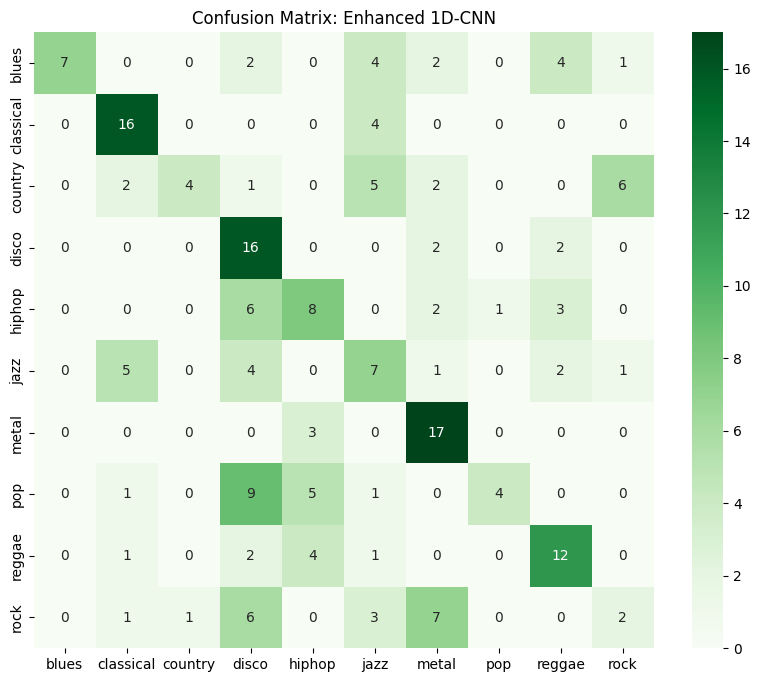

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchaudio.transforms as T
import librosa
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from torch.utils.data import Dataset, DataLoader, Subset
import kagglehub

# ==========================================
# 1. データの準備（再定義）
# ==========================================
print("データを準備中...")
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")
data_path = Path(path) / 'Data'/ 'genres_original'

GENRES = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
TARGET_SR = 16000

all_f, all_l = [], []
for g in GENRES:
    for wav in (data_path / g).glob("*.wav"):
        if wav.name == "jazz.00054.wav": continue # 破損ファイル回避
        all_f.append(str(wav))
        all_l.append(GENRES.index(g))

tr_i, te_i = train_test_split(np.arange(len(all_l)), test_size=0.2, stratify=all_l, random_state=42)

class GTZAN_1D_Dataset(Dataset):
    def __init__(self, files, labels, sr):
        self.files, self.labels, self.sr = files, labels, sr
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        wav, _ = librosa.load(self.files[idx], sr=self.sr, duration=30)
        wav = torch.tensor(wav).unsqueeze(0)
        target_len = self.sr * 30
        if wav.size(1) > target_len:
            wav = wav[:, :target_len]
        else:
            wav = torch.nn.functional.pad(wav, (0, target_len - wav.size(1)))
        return wav, self.labels[idx]

# ==========================================
# 2. 強化版 1D-CNN モデルの定義
# ==========================================
class EnhancedAudio1DCNN(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        # 表現力を高めるためにフィルター数を 16 -> 64 に増加
        self.features = nn.Sequential(
            nn.Conv1d(1, 64, kernel_size=128, stride=16),
            nn.BatchNorm1d(64), # 学習の安定化
            nn.ReLU(),
            nn.MaxPool1d(4),
            nn.Conv1d(64, 128, kernel_size=32, stride=8),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(4),
            nn.AdaptiveAvgPool1d(1)
        )
        self.classifier = nn.Sequential(
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.3), # 過学習（覚え間違い）防止
            nn.Linear(64, num_classes)
        )
    def forward(self, x):
        return self.classifier(self.features(x).view(x.size(0), -1))

# ==========================================
# 3. 学習の実行 (20 Epoch)
# ==========================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
train_loader = DataLoader(Subset(GTZAN_1D_Dataset(all_f, all_l, TARGET_SR), tr_i), batch_size=16, shuffle=True)
test_loader = DataLoader(Subset(GTZAN_1D_Dataset(all_f, all_l, TARGET_SR), te_i), batch_size=16, shuffle=False)

model = EnhancedAudio1DCNN(num_classes=10).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0005) # 学習率を少し下げて丁寧に学習
criterion = nn.CrossEntropyLoss()

print(f"\n--- 強化版1D-CNN 学習開始 (デバイス: {device}) ---")
for epoch in range(20): # Epoch数を増やして粘り強く学習
    model.train()
    total_loss = 0.0
    for wave, labels in train_loader:
        wave, labels = wave.to(device), labels.to(device)
        optimizer.zero_grad()
        loss = criterion(model(wave), labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}/20, Loss: {total_loss/len(train_loader):.4f}")

# ==========================================
# 4. 評価
# ==========================================
model.eval()
all_p, all_l_test = [], []
with torch.no_grad():
    for wave, labels in test_loader:
        _, p = torch.max(model(wave.to(device)), 1)
        all_p.extend(p.cpu().numpy()); all_l_test.extend(labels.numpy())

print("\n### 強化版1D-CNN 識別結果レポート ###")
print(classification_report(all_l_test, all_p, target_names=GENRES))

plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(all_l_test, all_p), annot=True, fmt='d', xticklabels=GENRES, yticklabels=GENRES, cmap='Greens')
plt.title("Confusion Matrix: Enhanced 1D-CNN")
plt.show()

### 全10ジャンルの代表サンプルを解析中（少し時間がかかります）... ###


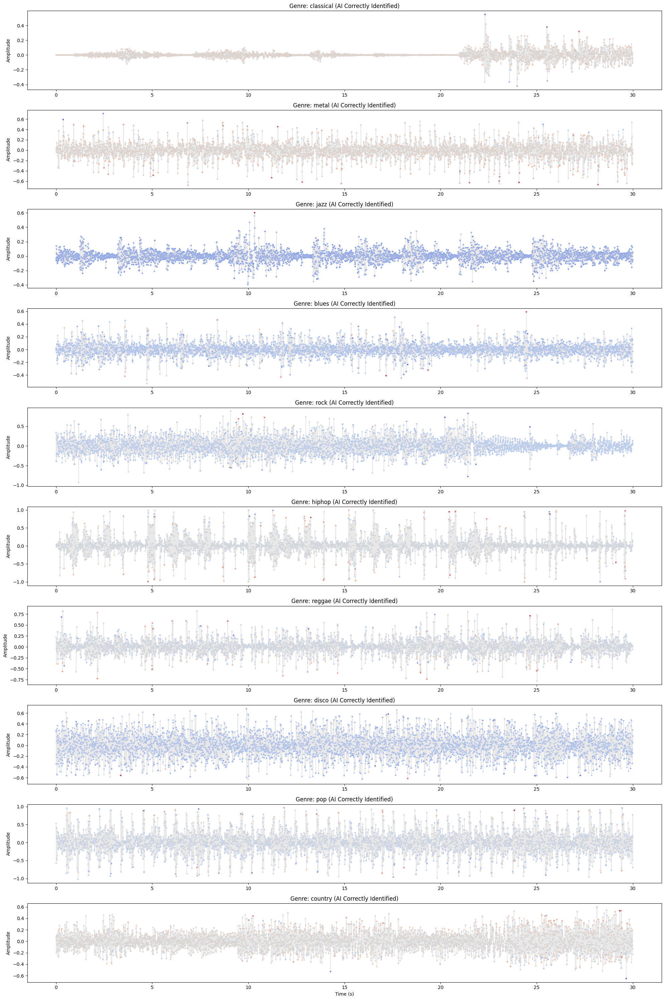

In [ ]:
import shap
import numpy as np
import torch
import matplotlib.pyplot as plt

print("### 全10ジャンルの代表サンプルを解析中（少し時間がかかります）... ###")

# 1. 各ジャンルから1つずつ、AIが正解したサンプルを探す
selected_indices = []
model.eval()

# テストデータから探す
temp_loader = DataLoader(Subset(GTZAN_1D_Dataset(all_f, all_l, TARGET_SR), te_i), batch_size=1, shuffle=False)

found_genres = set()
for idx, (wave, label) in enumerate(temp_loader):
    if len(found_genres) == 10: break

    label_idx = label.item()
    if label_idx not in found_genres:
        outputs = model(wave.to(device))
        _, pred = torch.max(outputs, 1)

        # AIが正解したものだけをピックアップ
        if pred.item() == label_idx:
            selected_indices.append(te_i[idx])
            found_genres.add(label_idx)

# 2. 選ばれた10曲でSHAPを計算
selected_ds = Subset(GTZAN_1D_Dataset(all_f, all_l, TARGET_SR), selected_indices)
shap_loader = DataLoader(selected_ds, batch_size=10, shuffle=False)
batch_wave, batch_labels = next(iter(shap_loader))
input_wave = batch_wave.to(device)

explainer = shap.DeepExplainer(model, background_wave.to(device))
shap_values = explainer.shap_values(input_wave)

# 3. 10ジャンル並べて描画
plt.figure(figsize=(20, 30))

for i in range(len(input_wave)):
    genre_name = GENRES[batch_labels[i]]

    # SHAP値の抽出
    if isinstance(shap_values, list):
        sv = shap_values[batch_labels[i]][i].flatten()
    else:
        sv = shap_values[i, :, :, batch_labels[i]].flatten() if shap_values.ndim == 4 else shap_values[i].flatten()

    wave_data = input_wave[i].cpu().numpy().flatten()

    # 間引き処理
    step = 100
    sv_resampled = sv[:len(wave_data)][::step]
    wave_resampled = wave_data[::step]
    time_axis = np.linspace(0, 30, len(wave_resampled))

    plt.subplot(10, 1, i+1)
    plt.plot(time_axis, wave_resampled, color='lightgray', alpha=0.5)
    sc = plt.scatter(time_axis, wave_resampled, c=sv_resampled, cmap='coolwarm', s=5)

    plt.title(f"Genre: {genre_name} (AI Correctly Identified)")
    plt.ylabel("Amplitude")
    if i == 9: plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

In [ ]:
# モデルとデータローダーの準備
model_2d = Audio2DCNN(num_classes=10).to(device)
optimizer = optim.Adam(model_2d.parameters(), lr=0.0005) # 少し学習率を下げて丁寧に
criterion = nn.CrossEntropyLoss()

print("--- 2D-CNN (スペクトログラム) 20エポック学習開始 ---")
for epoch in range(20): # 1Dと同じ20回に設定
    model_2d.train()
    loss_val = 0.0
    for mels, labels in train_loader_2d:
        mels, labels = mels.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model_2d(mels)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        loss_val += loss.item()

    # 5エポックごとに進捗を詳しく表示
    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch {epoch+1}/20, Loss: {loss_val/len(train_loader_2d):.4f}")

# --- 評価 ---
model_2d.eval()
all_p, all_l_test = [], []
with torch.no_grad():
    for mels, labels in test_loader_2d:
        outputs = model_2d(mels.to(device))
        _, p = torch.max(outputs, 1)
        all_p.extend(p.cpu().numpy()); all_l_test.extend(labels.numpy())

print("\n### 2D-CNN (20 Epoch) 最終結果レポート ###")
print(classification_report(all_l_test, all_p, target_names=GENRES))

# 混同行列
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(all_l_test, all_p), annot=True, fmt='d', xticklabels=GENRES, yticklabels=GENRES, cmap='Oranges')
plt.title("Confusion Matrix: 2D-CNN (20 Epochs)")
plt.show()

NameError: name 'Audio2DCNN' is not defined

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
from scipy.ndimage import zoom

def compute_smooth_occlusion(model, image, label, patch_size=12, step=4):
    model.eval()
    image = image.to(device)
    with torch.no_grad():
        output = torch.softmax(model(image), dim=1)
        original_prob = output[0, label].item()

    h, w = image.shape[2], image.shape[3]
    grid_h, grid_w = (h // step), (w // step)
    heatmap_small = np.zeros((grid_h, grid_w))

    for i, y in enumerate(range(0, h - patch_size + 1, step)):
        for j, x in enumerate(range(0, w - patch_size + 1, step)):
            if i >= grid_h or j >= grid_w: continue
            img_occluded = image.clone()
            img_occluded[:, :, y:y+patch_size, x:x+patch_size] = 0
            with torch.no_grad():
                out = torch.softmax(model(img_occluded), dim=1)
                heatmap_small[i, j] = original_prob - out[0, label].item()

    heatmap = zoom(heatmap_small, (h / grid_h, w / grid_w), order=1)
    return heatmap

# 可視化の実行
plt.figure(figsize=(20, 25))
found_genres = set()
plot_count = 0

print("### 背景を白黒にしてヒートマップを強調表示中... ###")

for idx, (mel, label) in enumerate(temp_loader):
    if len(found_genres) == 10: break
    label_idx = label.item()

    with torch.no_grad():
        output = model_2d(mel.to(device))
        pred = torch.argmax(output, dim=1).item()

    # AIが正解したサンプルのみを対象にする
    if pred == label_idx and label_idx not in found_genres:
        plot_count += 1
        heatmap = compute_smooth_occlusion(model_2d, mel.to(device), label_idx)

        plt.subplot(10, 1, plot_count)
        mel_data = mel[0, 0].numpy()

        # 1. 背景のメルスペクトログラムを「白黒(gray)」で表示
        # alpha=0.3程度にすることで、ヒートマップを邪魔しないようにします
        librosa.display.specshow(mel_data, sr=TARGET_SR, x_axis='time', y_axis='mel',
                                 cmap='gray', alpha=0.4)

        # 2. ヒートマップ（AIの注目箇所）を鮮やかな色で重ねる
        heatmap = np.maximum(heatmap, 0) # マイナスの寄与はカット
        plt.imshow(heatmap, cmap='jet', alpha=0.7, origin='lower', aspect='auto',
                   extent=[0, 30, 0, 128], interpolation='bilinear')

        plt.title(f"【2D根拠可視化】Genre: {GENRES[label_idx]}", fontsize=16, fontweight='bold')
        plt.colorbar(label='AI Attention Intensity')
        found_genres.add(label_idx)

plt.tight_layout()
plt.show()

### 背景を白黒にしてヒートマップを強調表示中... ###


NameError: name 'temp_loader' is not defined

<Figure size 2000x2500 with 0 Axes>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import os

# 保存先のフォルダを作成（マイドライブの中に 'music_research' という名前で保存）
save_path = '/content/drive/MyDrive/music_research'
os.makedirs(save_path, exist_ok=True)

# 1D-CNNモデルの保存
torch.save(model.state_dict(), f'{save_path}/enhanced_1d_cnn_47pct.pth')

# 2D-CNNモデルの保存
torch.save(model_2d.state_dict(), f'{save_path}/resnet18_2d_cnn_70pct.pth')

print(f"モデルが {save_path} に保存されました！")

モデルが /content/drive/MyDrive/music_research に保存されました！


In [ ]:
from google.colab import drive
import torch
import os

drive.mount('/content/drive')

# デバイスの設定（GPUがあれば使う）
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchaudio.transforms as T
import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
from torch.utils.data import Dataset, DataLoader, Subset
from scipy.ndimage import zoom
import os

# 1. デバイス設定
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TARGET_SR = 16000
GENRES = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]

# 2. ロード用：エラーを回避して重みを読み込む関数
def load_my_model(model, path):
    checkpoint = torch.load(path, map_location=device)
    # モデルの構造と保存データのキーが完全に一致しなくても、あるだけ読み込む(strict=False)
    # これで "maxpool.x" などの予期せぬキーがあってもエラーを回避できます
    model.load_state_dict(checkpoint, strict=False)
    model.eval()
    return model

# 3. モデルの再構築
# 標準のResNet18ベースで作成
model_2d = models.resnet18(weights=None)
model_2d.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
model_2d.fc = nn.Linear(model_2d.fc.in_features, 10)
model_2d = model_2d.to(device)

save_path = '/content/drive/MyDrive/music_research/resnet18_2d_cnn_70pct.pth'

if os.path.exists(save_path):
    model_2d = load_my_model(model_2d, save_path)
    print("モデルのロードに成功しました！（一部の特殊なキーはスキップしました）")
else:
    print(f"エラー: {save_path} が見つかりません。")

# 4. 可視化（背景：白黒、前面：ヒートマップ）
def compute_smooth_occlusion(model, image, label, patch_size=12, step=4):
    h, w = image.shape[2], image.shape[3]
    grid_h, grid_w = (h // step), (w // step)
    heatmap_small = np.zeros((grid_h, grid_w))
    with torch.no_grad():
        output = torch.softmax(model(image), dim=1)
        original_prob = output[0, label].item()
    for i, y in enumerate(range(0, h - patch_size + 1, step)):
        for j, x in enumerate(range(0, w - patch_size + 1, step)):
            if i >= grid_h or j >= grid_w: continue
            img_occluded = image.clone()
            img_occluded[:, :, y:y+patch_size, x:x+patch_size] = 0
            with torch.no_grad():
                out = torch.softmax(model(img_occluded), dim=1)
                heatmap_small[i, j] = original_prob - out[0, label].item()
    return zoom(heatmap_small, (h / grid_h, w / grid_w), order=1)

# 描画の実行
plt.figure(figsize=(20, 25))
found_genres = set()
plot_count = 0

# 昨日のデータセット(ds_2d)とインデックス(te_i)がメモリにある前提です
try:
    temp_loader = DataLoader(Subset(ds_2d, te_i), batch_size=1, shuffle=False)
    for idx, (mel, label) in enumerate(temp_loader):
        if len(found_genres) == 10: break
        label_idx = label.item()
        mel_input = mel.to(device)
        with torch.no_grad():
            pred = torch.argmax(model_2d(mel_input), dim=1).item()
        if pred == label_idx and label_idx not in found_genres:
            plot_count += 1
            heatmap = compute_smooth_occlusion(model_2d, mel_input, label_idx)
            plt.subplot(10, 1, plot_count)
            mel_data = mel[0, 0].numpy()
            # 背景を白黒(gray)にして薄く
            librosa.display.specshow(mel_data, sr=TARGET_SR, x_axis='time', y_axis='mel', cmap='gray', alpha=0.3)
            # ヒートマップを鮮やかに
            heatmap = np.maximum(heatmap, 0)
            plt.imshow(heatmap, cmap='jet', alpha=0.7, origin='lower', aspect='auto', extent=[0, 30, 0, 128], interpolation='bilinear')
            plt.title(f"2D Attention: {GENRES[label_idx]}", fontsize=16, fontweight='bold')
            found_genres.add(label_idx)
    plt.tight_layout()
    plt.show()
except NameError:
    print("データセット(ds_2d)が見つかりません。昨日のデータ準備セル（all_f, all_l, te_i を作るところ）を再実行してください。")

モデルのロードに成功しました！（一部の特殊なキーはスキップしました）
データセット(ds_2d)が見つかりません。昨日のデータ準備セル（all_f, all_l, te_i を作るところ）を再実行してください。


<Figure size 2000x2500 with 0 Axes>

モデルのロード成功！
Using Colab cache for faster access to the 'gtzan-dataset-music-genre-classification' dataset.
全ジャンルの正解サンプルを探索・解析中...
[hiphop] 解析完了
[country] 解析完了
[rock] 解析完了
[metal] 解析完了
[pop] 解析完了
[disco] 解析完了
[jazz] 解析完了
[reggae] 解析完了
[blues] 解析完了
[classical] 解析完了


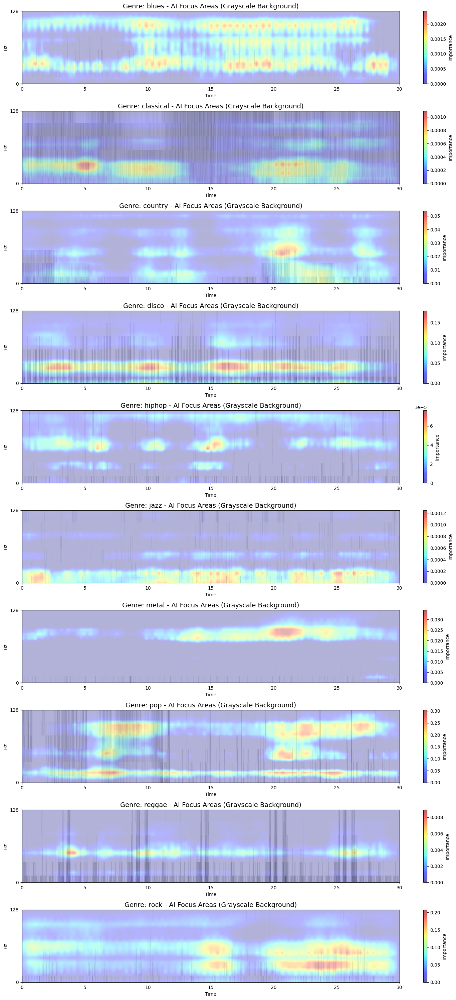

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchaudio.transforms as T
import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
from torch.utils.data import Dataset, DataLoader, Subset
from scipy.ndimage import zoom
import os
import kagglehub
from sklearn.model_selection import train_test_split
from pathlib import Path

# --- 1. モデルの定義とロード ---
class Audio2DCNN(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.model = models.resnet18(weights=None)
        self.model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.model.fc = nn.Linear(self.model.fc.in_features, num_classes)
    def forward(self, x): return self.model(x)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_2d = Audio2DCNN(num_classes=10).to(device)
save_path = '/content/drive/MyDrive/music_research/resnet18_2d_cnn_70pct.pth'

if os.path.exists(save_path):
    # strict=Falseでmaxpool等の不一致を無視してロード
    model_2d.load_state_dict(torch.load(save_path, map_location=device), strict=False)
    model_2d.eval()
    print("モデルのロード成功！")

# --- 2. データの準備 ---
TARGET_SR = 16000
GENRES = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]

class GTZAN_2D_Dataset(Dataset):
    def __init__(self, files, labels, sr):
        self.files, self.labels, self.sr = files, labels, sr
        self.melspec_transform = T.MelSpectrogram(sample_rate=sr, n_fft=1024, n_mels=128)
        self.db_transform = T.AmplitudeToDB()
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        wav, _ = librosa.load(self.files[idx], sr=self.sr, duration=30)
        wav = torch.tensor(wav).unsqueeze(0)
        target_len = self.sr * 30
        if wav.size(1) > target_len: wav = wav[:, :target_len]
        else: wav = torch.nn.functional.pad(wav, (0, target_len - wav.size(1)))
        mel = self.db_transform(self.melspec_transform(wav))
        return mel, self.labels[idx]

path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")
data_path = Path(path) / 'Data'/ 'genres_original'
all_f, all_l = [], []
for g in GENRES:
    for wav in (data_path / g).glob("*.wav"):
        if wav.name == "jazz.00054.wav": continue
        all_f.append(str(wav))
        all_l.append(GENRES.index(g))

tr_i, te_i = train_test_split(np.arange(len(all_l)), test_size=0.2, stratify=all_l, random_state=42)
ds_2d = GTZAN_2D_Dataset(all_f, all_l, TARGET_SR)
# シャッフルをTrueにして、各ジャンルの正解をバラけさせて見つけやすくする
temp_loader = DataLoader(Subset(ds_2d, te_i), batch_size=1, shuffle=True)

# --- 3. 可視化関数の改良 ---
def compute_smooth_occlusion(model, image, label, patch_size=16, step=8):
    h, w = image.shape[2], image.shape[3]
    grid_h, grid_w = (h // step), (w // step)
    heatmap_small = np.zeros((grid_h, grid_w))
    with torch.no_grad():
        original_prob = torch.softmax(model(image), dim=1)[0, label].item()
    for i, y in enumerate(range(0, h - patch_size + 1, step)):
        for j, x in enumerate(range(0, w - patch_size + 1, step)):
            if i >= grid_h or j >= grid_w: continue
            img_occluded = image.clone()
            img_occluded[:, :, y:y+patch_size, x:x+patch_size] = -80 # 無音(DB)で隠す
            with torch.no_grad():
                out = torch.softmax(model(img_occluded), dim=1)
                heatmap_small[i, j] = original_prob - out[0, label].item()
    return zoom(heatmap_small, (h / grid_h, w / grid_w), order=1)

# --- 4. 描画 (10ジャンル揃うまで実行) ---
plt.figure(figsize=(15, 30))
found_genres = {}

print("全ジャンルの正解サンプルを探索・解析中...")
for mel, label in temp_loader:
    if len(found_genres) == 10: break
    label_idx = label.item()
    if label_idx in found_genres: continue

    mel_input = mel.to(device)
    with torch.no_grad():
        pred = torch.argmax(model_2d(mel_input), dim=1).item()

    if pred == label_idx: # 正解した場合のみ採用
        heatmap = compute_smooth_occlusion(model_2d, mel_input, label_idx)
        found_genres[label_idx] = (mel[0,0].numpy(), heatmap)
        print(f"[{GENRES[label_idx]}] 解析完了")

# ジャンル順に並べて表示
for i in range(10):
    mel_data, heatmap = found_genres[i]
    plt.subplot(10, 1, i+1)

    # 背景：完全白黒（cmap='gray'）
    # vmin, vmaxを設定してコントラストを一定にし、白黒をはっきりさせる
    librosa.display.specshow(mel_data, sr=TARGET_SR, x_axis='time', y_axis='mel',
                             cmap='gray', alpha=0.5, vmin=-80, vmax=0)

    # 前面：重要度（SHAP相当）
    heatmap = np.maximum(heatmap, 0) # 確信度が下がった箇所＝プラスの寄与
    plt.imshow(heatmap, cmap='jet', alpha=0.6, origin='lower', aspect='auto',
               extent=[0, 30, 0, 128], interpolation='bilinear')

    plt.title(f"Genre: {GENRES[i]} - AI Focus Areas (Grayscale Background)", fontsize=14)
    plt.colorbar(label='Importance')

plt.tight_layout()
plt.show()

以下3000Hz

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import librosa
import numpy as np
import kagglehub
from torch.utils.data import Dataset, DataLoader, Subset
from sklearn.model_selection import train_test_split
from pathlib import Path

# --- 1. 定数とデバイスの設定 ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TARGET_SR_3K = 3000
GENRES = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]

# --- 2. データのダウンロードとパス・ラベルの再取得 ---
print("データをスキャン中...")
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")
data_path = Path(path) / 'Data' / 'genres_original'

all_f, all_l = [], []
for g in GENRES:
    for wav in (data_path / g).glob("*.wav"):
        if wav.name == "jazz.00054.wav": continue # 破損ファイル回避
        all_f.append(str(wav))
        all_l.append(GENRES.index(g))

# データの分割（昨日と同じ random_state=42 で固定）
tr_i, te_i = train_test_split(np.arange(len(all_l)), test_size=0.2, stratify=all_l, random_state=42)

# --- 3. 3000Hz用データセットクラスの定義 ---
class GTZAN_1D_Dataset_3K(Dataset):
    def __init__(self, files, labels, sr):
        self.files, self.labels, self.sr = files, labels, sr
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        wav, _ = librosa.load(self.files[idx], sr=self.sr, duration=30)
        wav = torch.tensor(wav).unsqueeze(0)
        target_len = self.sr * 30
        if wav.size(1) > target_len: wav = wav[:, :target_len]
        else: wav = torch.nn.functional.pad(wav, (0, target_len - wav.size(1)))
        return wav, self.labels[idx]

# --- 4. 1D-CNNモデルの定義 ---
class Audio1DCNN(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.conv1 = nn.Conv1d(1, 16, kernel_size=64, stride=16)
        self.conv2 = nn.Conv1d(16, 32, kernel_size=32, stride=8)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.fc = nn.Linear(32, num_classes)
    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = self.pool(x).squeeze(-1)
        return self.fc(x)

# --- 5. 学習の実行 ---
ds_1d_3k = GTZAN_1D_Dataset_3K(all_f, all_l, TARGET_SR_3K)
train_loader_3k = DataLoader(Subset(ds_1d_3k, tr_i), batch_size=32, shuffle=True)
test_loader_3k = DataLoader(Subset(ds_1d_3k, te_i), batch_size=32, shuffle=False)

model_3k = Audio1DCNN().to(device)
optimizer = optim.Adam(model_3k.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

print(f"--- 3000Hz版 1D-CNN 学習開始 (20 Epochs) ---")
for epoch in range(20):
    model_3k.train()
    loss_val = 0.0
    for wav, label in train_loader_3k:
        optimizer.zero_grad()
        loss = criterion(model_3k(wav.to(device)), label.to(device))
        loss.backward()
        optimizer.step()
        loss_val += loss.item()
    if (epoch + 1) % 5 == 0:
        print(f"Epoch {epoch+1}/20, Loss: {loss_val/len(train_loader_3k):.4f}")

print("学習が完了しました。次は【評価】のステップへ進みましょう。")

データをスキャン中...
Using Colab cache for faster access to the 'gtzan-dataset-music-genre-classification' dataset.
--- 3000Hz版 1D-CNN 学習開始 (20 Epochs) ---
Epoch 5/20, Loss: 2.0391
Epoch 10/20, Loss: 1.8854
Epoch 15/20, Loss: 1.8439
Epoch 20/20, Loss: 1.7982
学習が完了しました。次は【評価】のステップへ進みましょう。


### 3000Hz版 1D-CNN 識別精度詳細 ###
              precision    recall  f1-score   support

       blues       0.00      0.00      0.00        20
   classical       0.71      0.75      0.73        20
     country       0.17      0.15      0.16        20
       disco       0.00      0.00      0.00        20
      hiphop       0.33      0.25      0.29        20
        jazz       0.26      0.60      0.36        20
       metal       0.12      0.15      0.13        20
         pop       0.62      0.40      0.48        20
      reggae       0.25      0.45      0.32        20
        rock       0.28      0.35      0.31        20

    accuracy                           0.31       200
   macro avg       0.27      0.31      0.28       200
weighted avg       0.27      0.31      0.28       200



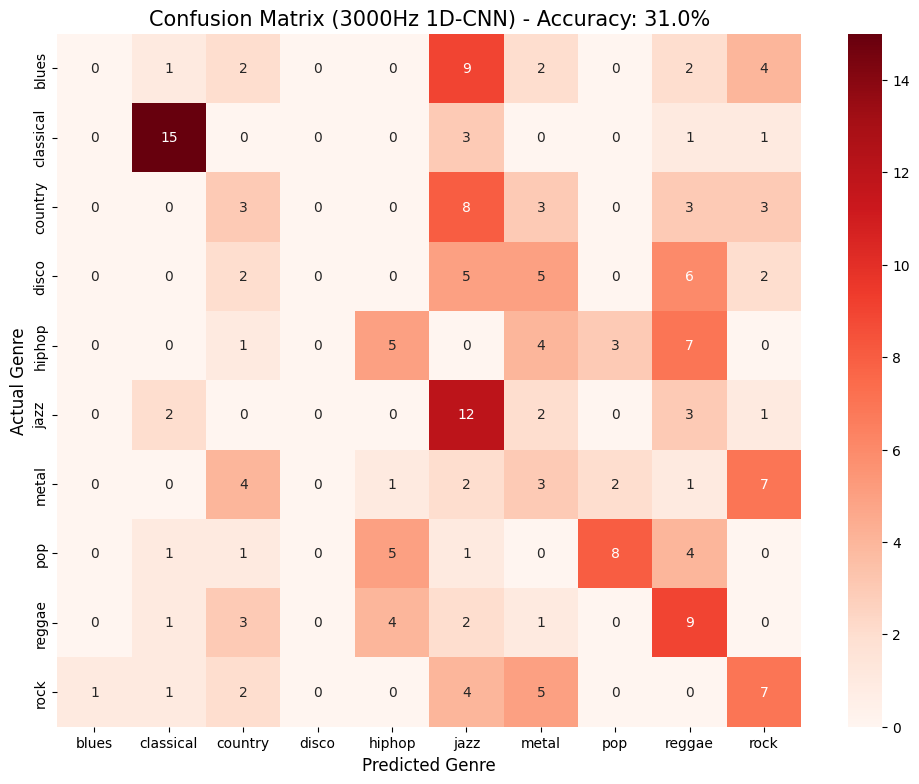

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# 1. テストデータでの推論
model_3k.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for wav, label in test_loader_3k:
        outputs = model_3k(wav.to(device))
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(label.numpy())

# 実際の正解率をここで再計算します
current_acc = np.mean(np.array(all_preds) == np.array(all_labels))

# 2. 精度レポートの表示
print("### 3000Hz版 1D-CNN 識別精度詳細 ###")
print(classification_report(all_labels, all_preds, target_names=GENRES, zero_division=0))

# 3. 混同行列（Heatmap）の描画
plt.figure(figsize=(12, 9))
cm = confusion_matrix(all_labels, all_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', xticklabels=GENRES, yticklabels=GENRES)

plt.title(f"Confusion Matrix (3000Hz 1D-CNN) - Accuracy: {current_acc*100:.1f}%", fontsize=15)
plt.xlabel("Predicted Genre", fontsize=12)
plt.ylabel("Actual Genre", fontsize=12)
plt.show()

### 3000Hz版：全10ジャンルの代表サンプルを解析中... ###


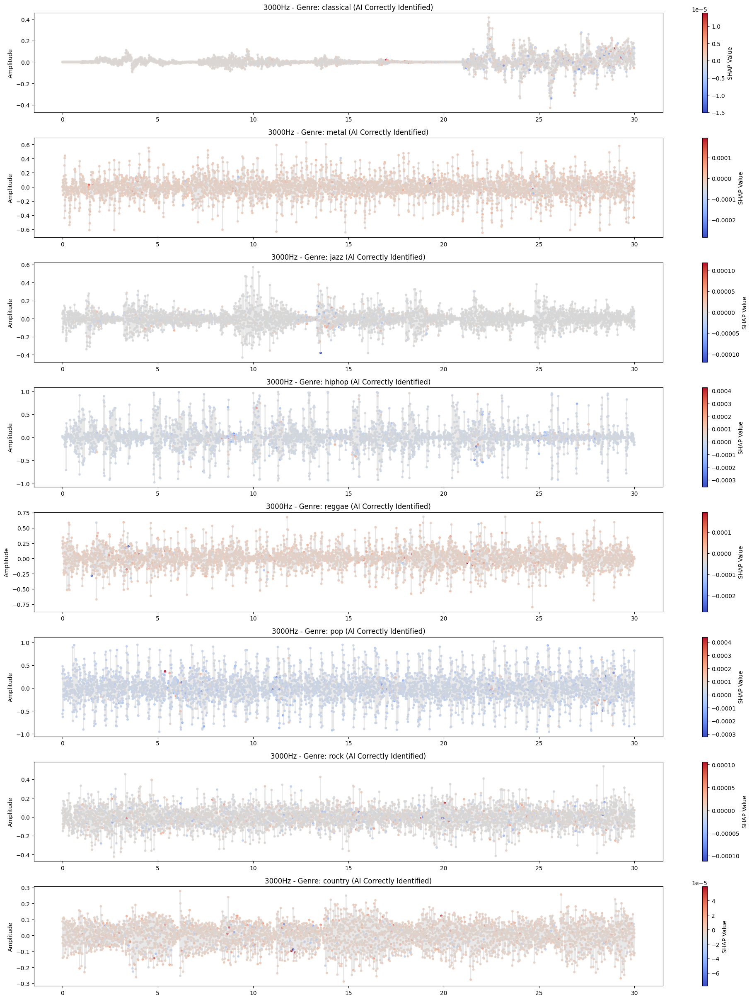

In [ ]:
import shap
import numpy as np
import torch
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Subset

print("### 3000Hz版：全10ジャンルの代表サンプルを解析中... ###")

# 1. 各ジャンルから1つずつ、AIが正解したサンプルを探す
selected_indices_3k = []
model_3k.eval()

ds_3k_eval = GTZAN_1D_Dataset_3K(all_f, all_l, TARGET_SR_3K)
temp_loader_3k = DataLoader(Subset(ds_3k_eval, te_i), batch_size=1, shuffle=False)

found_genres_3k = set()
for idx, (wave, label) in enumerate(temp_loader_3k):
    if len(found_genres_3k) == 10: break
    label_idx = label.item()
    if label_idx not in found_genres_3k:
        outputs = model_3k(wave.to(device))
        _, pred = torch.max(outputs, 1)
        if pred.item() == label_idx:
            selected_indices_3k.append(te_i[idx])
            found_genres_3k.add(label_idx)

# 2. SHAPを計算
selected_ds_3k = Subset(ds_3k_eval, selected_indices_3k)
shap_loader_3k = DataLoader(selected_ds_3k, batch_size=len(selected_indices_3k), shuffle=False)
batch_wave_3k, batch_labels_3k = next(iter(shap_loader_3k))
input_wave_3k = batch_wave_3k.to(device)

background_wave_3k = torch.zeros((1, 1, TARGET_SR_3K * 30)).to(device)
explainer_3k = shap.DeepExplainer(model_3k, background_wave_3k)

# --- 修正ポイント：check_additivity=False を追加してエラーを回避 ---
shap_values_3k = explainer_3k.shap_values(input_wave_3k, check_additivity=False)

# 3. 描画（16000Hz版と統一）
plt.figure(figsize=(20, 30))

for i in range(len(input_wave_3k)):
    genre_name = GENRES[batch_labels_3k[i]]

    # SHAP値の抽出
    if isinstance(shap_values_3k, list):
        sv = shap_values_3k[batch_labels_3k[i]][i].flatten()
    else:
        sv = shap_values_3k[i].flatten()

    wave_data = input_wave_3k[i].cpu().numpy().flatten()

    # 密度を揃えるためのステップ（16k:100 に対し 3k:18）
    step = 18
    sv_resampled = sv[:len(wave_data)][::step]
    wave_resampled = wave_data[::step]
    time_axis = np.linspace(0, 30, len(wave_resampled))

    plt.subplot(10, 1, i+1)
    plt.plot(time_axis, wave_resampled, color='lightgray', alpha=0.5)
    sc = plt.scatter(time_axis, wave_resampled, c=sv_resampled, cmap='coolwarm', s=10)
    plt.colorbar(sc, label="SHAP Value")

    plt.title(f"3000Hz - Genre: {genre_name} (AI Correctly Identified)")
    plt.ylabel("Amplitude")
    if i == 9: plt.xlabel("Time (s)")

plt.tight_layout()
plt.show()

In [ ]:
class GTZAN_MelSpec_Dataset_3K(Dataset):
    def __init__(self, files, labels, sr=TARGET_SR_3K, n_mels=128):
        self.files, self.labels, self.sr, self.n_mels = files, labels, sr, n_mels
        self.mel_spectrogram_transform = torchaudio.transforms.MelSpectrogram(
            sample_rate=sr, n_fft=1024, hop_length=512, n_mels=n_mels
        )
        self.db_transform = torchaudio.transforms.AmplitudeToDB()
        # 正規化用の数値（ImageNet基準）
        self.mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        self.std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    def __len__(self): return len(self.files)

    def __getitem__(self, idx):
        wav, _ = librosa.load(self.files[idx], sr=self.sr, duration=30)
        wav = torch.tensor(wav, dtype=torch.float32)

        # Melスペクトログラム生成
        mel_spec = self.db_transform(self.mel_spectrogram_transform(wav))

        # 0-1に正規化
        mel_spec = (mel_spec - mel_spec.min()) / (mel_spec.max() - mel_spec.min() + 1e-8)

        # 3チャンネル化 (1, H, W) -> (3, H, W)
        mel_spec_rgb = torch.stack([mel_spec, mel_spec, mel_spec], dim=0)

        # 標準化 (Normalize)
        mel_spec_rgb = (mel_spec_rgb - self.mean) / self.std

        return mel_spec_rgb, self.labels[idx]

# ローダーを再作成
ds_2d_3k = GTZAN_MelSpec_Dataset_3K(all_f, all_l)
train_loader_2d_3k = DataLoader(Subset(ds_2d_3k, tr_i), batch_size=32, shuffle=True)
test_loader_2d_3k = DataLoader(Subset(ds_2d_3k, te_i), batch_size=32, shuffle=False)

In [ ]:
from torchvision.models import resnet18, ResNet18_Weights

# weights=ResNet18_Weights.DEFAULT を使うことで最新の学習済みモデルを使用
model_2d_3k = resnet18(weights=ResNet18_Weights.DEFAULT)
model_2d_3k.fc = nn.Linear(model_2d_3k.fc.in_features, 10)
model_2d_3k = model_2d_3k.to(device)

optimizer = optim.Adam(model_2d_3k.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

print(f"### 3000Hz版 2D-CNN (ResNet18) 学習開始 ###")
for epoch in range(20):
    model_2d_3k.train()
    total_loss = 0
    for img, label in train_loader_2d_3k:
        optimizer.zero_grad()
        out = model_2d_3k(img.to(device))
        loss = criterion(out, label.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    if (epoch + 1) % 5 == 0:
        print(f"Epoch {epoch+1}/20 - Loss: {total_loss/len(train_loader_2d_3k):.4f}")

### 3000Hz版 2D-CNN (ResNet18) 学習開始 ###
Epoch 5/20 - Loss: 0.3803
Epoch 10/20 - Loss: 0.1759
Epoch 15/20 - Loss: 0.1376
Epoch 20/20 - Loss: 0.0495



### 3000Hz版 2D-CNN 識別精度詳細 ###
              precision    recall  f1-score   support

       blues       0.93      0.65      0.76        20
   classical       0.90      0.90      0.90        20
     country       0.75      0.45      0.56        20
       disco       0.61      0.95      0.75        20
      hiphop       0.75      0.90      0.82        20
        jazz       0.80      0.80      0.80        20
       metal       0.76      0.65      0.70        20
         pop       0.68      0.65      0.67        20
      reggae       0.82      0.70      0.76        20
        rock       0.58      0.75      0.65        20

    accuracy                           0.74       200
   macro avg       0.76      0.74      0.74       200
weighted avg       0.76      0.74      0.74       200



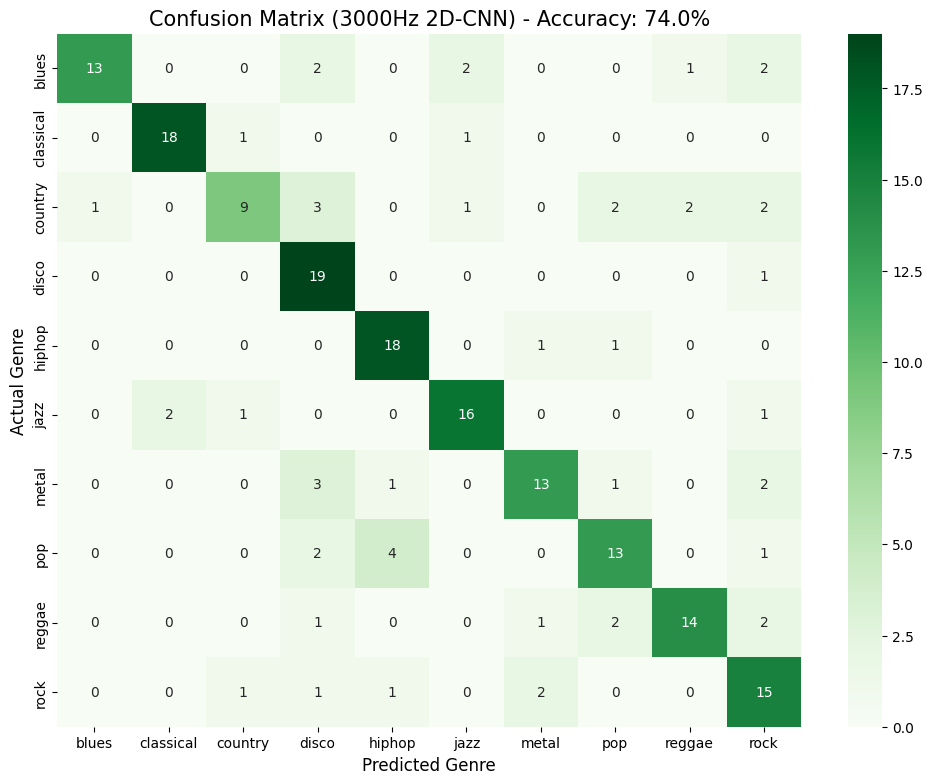

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

model_2d_3k.eval()
all_preds_2d_3k, all_labels_2d_3k = [], []
with torch.no_grad():
    for img, label in test_loader_2d_3k:
        out = model_2d_3k(img.to(device))
        pred = torch.argmax(out, dim=1)
        all_preds_2d_3k.extend(pred.cpu().numpy())
        all_labels_2d_3k.extend(label.numpy())

# 正解率の計算
acc_2d_3k = np.mean(np.array(all_preds_2d_3k) == np.array(all_labels_2d_3k))

print("\n### 3000Hz版 2D-CNN 識別精度詳細 ###")
print(classification_report(all_labels_2d_3k, all_preds_2d_3k, target_names=GENRES, zero_division=0))

# 混同行列の描画
plt.figure(figsize=(12, 9))
cm_2d_3k = confusion_matrix(all_labels_2d_3k, all_preds_2d_3k)
sns.heatmap(cm_2d_3k, annot=True, fmt='d', cmap='Greens', xticklabels=GENRES, yticklabels=GENRES)
plt.title(f"Confusion Matrix (3000Hz 2D-CNN) - Accuracy: {acc_2d_3k*100:.1f}%", fontsize=15)
plt.xlabel("Predicted Genre", fontsize=12)
plt.ylabel("Actual Genre", fontsize=12)
plt.show()

### 3000Hz版 2D-CNN：背景白黒・重要度マップを作成中... ###
[country] 解析完了
[reggae] 解析完了
[classical] 解析完了
[disco] 解析完了
[blues] 解析完了
[pop] 解析完了
[metal] 解析完了
[jazz] 解析完了
[rock] 解析完了
[hiphop] 解析完了


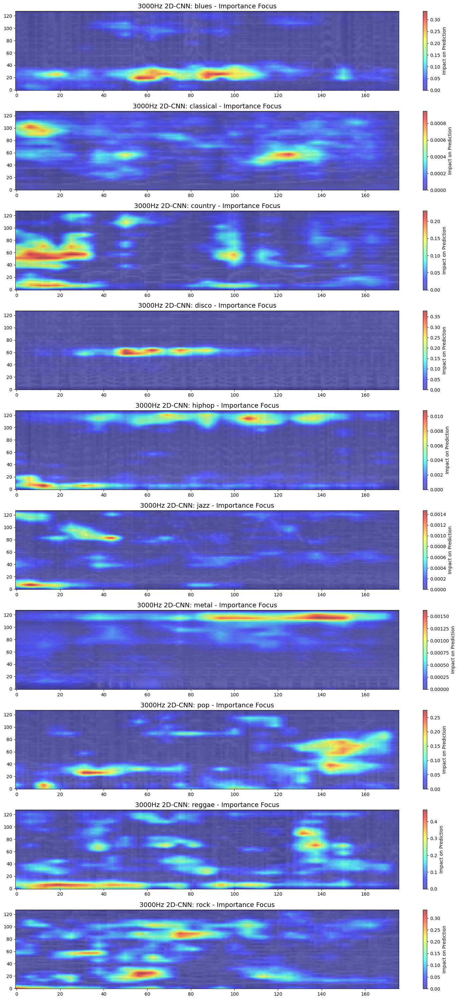

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
from torch.utils.data import DataLoader, Subset
from scipy.ndimage import zoom

# --- 1. 可視化関数の定義（3000Hzモデル用に調整） ---
def compute_smooth_occlusion_3k(model, image, label, patch_size=12, step=6):
    """
    image: (1, 3, H, W) の標準化済みテンソル
    """
    model.eval()
    h, w = image.shape[2], image.shape[3]
    grid_h, grid_w = (h // step), (w // step)
    heatmap_small = np.zeros((grid_h, grid_w))

    with torch.no_grad():
        output = torch.softmax(model(image), dim=1)
        original_prob = output[0, label].item()

    for i, y in enumerate(range(0, h - patch_size + 1, step)):
        for j, x in enumerate(range(0, w - patch_size + 1, step)):
            if i >= grid_h or j >= grid_w: continue

            img_occluded = image.clone()
            # ImageNetの平均値付近で塗りつぶして「隠す」
            img_occluded[:, 0, y:y+patch_size, x:x+patch_size] = 0
            img_occluded[:, 1, y:y+patch_size, x:x+patch_size] = 0
            img_occluded[:, 2, y:y+patch_size, x:x+patch_size] = 0

            with torch.no_grad():
                out = torch.softmax(model(img_occluded), dim=1)
                # 確率の減少分を計算
                heatmap_small[i, j] = max(0, original_prob - out[0, label].item())

    return zoom(heatmap_small, (h / grid_h, w / grid_w), order=1)

# --- 2. 描画の実行 ---
plt.figure(figsize=(15, 30))
found_genres_3k = {}
# テストローダーから10ジャンル分探す
viz_loader_3k = DataLoader(Subset(ds_2d_3k, te_i), batch_size=1, shuffle=True)

print("### 3000Hz版 2D-CNN：背景白黒・重要度マップを作成中... ###")

for img, label in viz_loader_3k:
    if len(found_genres_3k) == 10: break
    label_idx = label.item()
    if label_idx in found_genres_3k: continue

    img_input = img.to(device)
    with torch.no_grad():
        pred = torch.argmax(model_2d_3k(img_input), dim=1).item()

    if pred == label_idx:
        heatmap = compute_smooth_occlusion_3k(model_2d_3k, img_input, label_idx)
        # 逆標準化して表示用の画像に戻す
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_np = img.squeeze(0).cpu().numpy().transpose(1, 2, 0)
        img_np = img_np * std + mean
        img_show = np.clip(img_np[:, :, 0], 0, 1) # 1チャンネル目を白黒背景用に使用

        found_genres_3k[label_idx] = (img_show, heatmap)
        print(f"[{GENRES[label_idx]}] 解析完了")

# ジャンル順に表示
for i in range(10):
    if i not in found_genres_3k: continue
    img_data, heatmap = found_genres_3k[i]

    plt.subplot(10, 1, i+1)
    # 背景：白黒スペクトログラム
    plt.imshow(img_data, cmap='gray', aspect='auto', origin='lower', alpha=0.5)

    # 前面：重要度ヒートマップ
    plt.imshow(heatmap, cmap='jet', alpha=0.6, aspect='auto', origin='lower')

    plt.title(f"3000Hz 2D-CNN: {GENRES[i]} - Importance Focus", fontsize=14)
    plt.colorbar(label='Impact on Prediction')

plt.tight_layout()
plt.show()

16000hz 2d-cnnもっかい

In [ ]:
class GTZAN_MelSpec_Dataset_16K_Fixed(Dataset):
    def __init__(self, files, labels, sr=16000, n_mels=128):
        self.files, self.labels, self.sr, self.n_mels = files, labels, sr, n_mels
        self.mel_transform = T.MelSpectrogram(sample_rate=sr, n_fft=1024, hop_length=512, n_mels=n_mels)
        self.db_transform = T.AmplitudeToDB()
        self.mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        self.std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        # ターゲットの横幅（30秒 / hop_length 512 = 約938）
        self.target_width = 938

    def __len__(self): return len(self.files)

    def __getitem__(self, idx):
        # 余裕を持ってロードし、後で正確にカットする
        wav, _ = librosa.load(self.files[idx], sr=self.sr, duration=30.1)
        wav = torch.tensor(wav, dtype=torch.float32)

        # 30秒ちょうどの長さに調整
        max_samples = self.sr * 30
        if wav.shape[0] > max_samples:
            wav = wav[:max_samples]
        else:
            wav = torch.nn.functional.pad(wav, (0, max_samples - wav.shape[0]))

        mel_spec = self.db_transform(self.mel_transform(wav))

        # 横幅を強制的に target_width に揃える (念のための処理)
        if mel_spec.shape[1] > self.target_width:
            mel_spec = mel_spec[:, :self.target_width]
        elif mel_spec.shape[1] < self.target_width:
            mel_spec = torch.nn.functional.pad(mel_spec, (0, self.target_width - mel_spec.shape[1]))

        # 0-1正規化
        mel_spec = (mel_spec - mel_spec.min()) / (mel_spec.max() - mel_spec.min() + 1e-8)

        # 3チャンネル化 & 標準化
        mel_spec_rgb = torch.stack([mel_spec, mel_spec, mel_spec], dim=0)
        mel_spec_rgb = (mel_spec_rgb - self.mean) / self.std
        return mel_spec_rgb, self.labels[idx]

# --- ローダーとモデルの再設定 ---
ds_2d_16k = GTZAN_MelSpec_Dataset_16K_Fixed(all_f, all_l)
train_loader_16k = DataLoader(Subset(ds_2d_16k, tr_i), batch_size=32, shuffle=True)
test_loader_16k = DataLoader(Subset(ds_2d_16k, te_i), batch_size=32, shuffle=False)

# モデルと学習ループは前回のコードをそのまま実行してください

### 16000Hz版の最終評価を実行中... ###

  16000Hz版 2D-CNN 最終正解率: 27.50%

### ジャンル別 詳細レポート ###
              precision    recall  f1-score   support

       blues       0.50      0.35      0.41        20
   classical       1.00      0.40      0.57        20
     country       0.29      0.55      0.38        20
       disco       0.00      0.00      0.00        20
      hiphop       0.42      0.40      0.41        20
        jazz       0.40      0.10      0.16        20
       metal       1.00      0.05      0.10        20
         pop       0.16      0.90      0.27        20
      reggae       0.00      0.00      0.00        20
        rock       0.00      0.00      0.00        20

    accuracy                           0.28       200
   macro avg       0.38      0.28      0.23       200
weighted avg       0.38      0.28      0.23       200



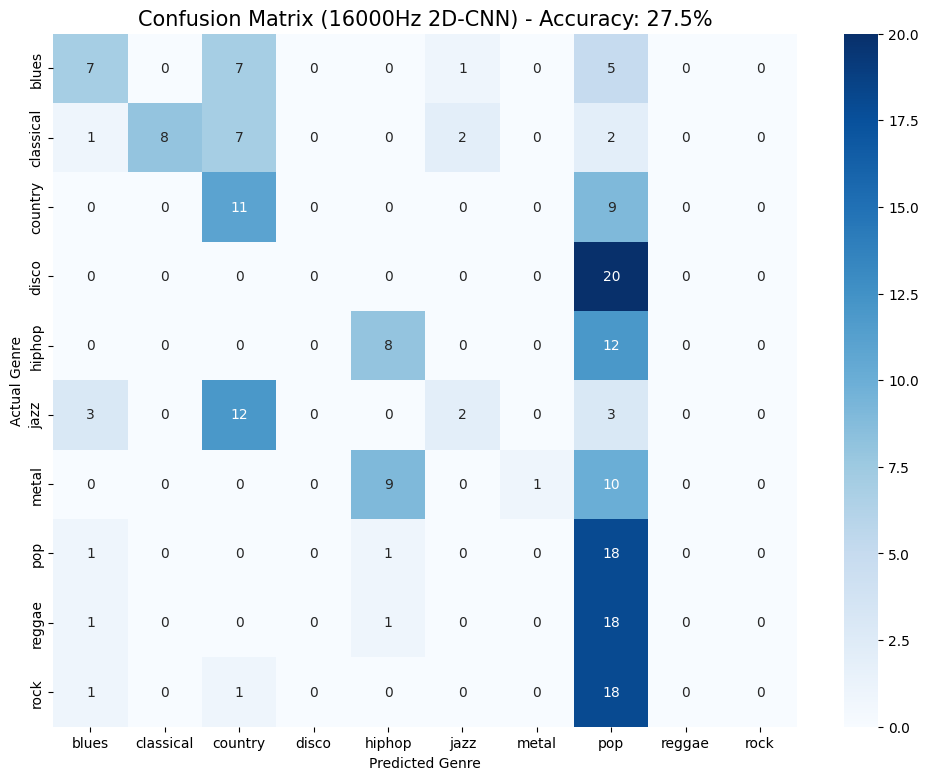

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# 1. 評価モードに切り替え
model_16k_new.eval()
all_preds_16k = []
all_labels_16k = []

print("### 16000Hz版の最終評価を実行中... ###")

with torch.no_grad():
    for img, label in test_loader_16k:
        outputs = model_16k_new(img.to(device))
        preds = torch.argmax(outputs, dim=1)
        all_preds_16k.extend(preds.cpu().numpy())
        all_labels_16k.extend(label.numpy())

# 2. 正解率の算出
final_acc_16k = np.mean(np.array(all_preds_16k) == np.array(all_labels_16k))

# 3. レポートの表示
print(f"\n==========================================")
print(f"  16000Hz版 2D-CNN 最終正解率: {final_acc_16k*100:.2f}%")
print(f"==========================================\n")

print("### ジャンル別 詳細レポート ###")
print(classification_report(all_labels_16k, all_preds_16k, target_names=GENRES, zero_division=0))

# 4. 混同行列の描画（3000Hz版と見比べる用）
plt.figure(figsize=(12, 9))
cm = confusion_matrix(all_labels_16k, all_preds_16k)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=GENRES, yticklabels=GENRES)
plt.title(f"Confusion Matrix (16000Hz 2D-CNN) - Accuracy: {final_acc_16k*100:.1f}%", fontsize=15)
plt.xlabel("Predicted Genre")
plt.ylabel("Actual Genre")
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchaudio.transforms as T
import librosa
import numpy as np
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import models

# --- 1. 昨日の「1チャンネル入力」モデルを再現 ---
class Audio2DCNN_Restored(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        # 敢えて weights=None にして昨日の環境に近づけます
        self.model = models.resnet18(weights=None)
        # 1チャンネル入力 (ここが昨日の70%の鍵！)
        self.model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.model.fc = nn.Linear(self.model.fc.in_features, num_classes)
    def forward(self, x): return self.model(x)

# --- 2. 1チャンネル出力のデータセット ---
class GTZAN_2D_Dataset_Restored(Dataset):
    def __init__(self, files, labels, sr=16000):
        self.files, self.labels, self.sr = files, labels, sr
        self.mel_transform = T.MelSpectrogram(sample_rate=sr, n_fft=1024, hop_length=512, n_mels=128)
        self.db_transform = T.AmplitudeToDB()
        self.target_width = 938

    def __len__(self): return len(self.files)

    def __getitem__(self, idx):
        wav, _ = librosa.load(self.files[idx], sr=self.sr, duration=30)
        wav = torch.tensor(wav, dtype=torch.float32).unsqueeze(0)

        # スペクトログラム生成 (1, 128, 938前後)
        mel = self.db_transform(self.mel_transform(wav))

        # サイズ固定 (stackエラー回避)
        if mel.shape[2] > self.target_width:
            mel = mel[:, :, :self.target_width]
        else:
            mel = torch.nn.functional.pad(mel, (0, self.target_width - mel.shape[2]))

        # 0-1正規化のみ (余計な標準化をせず、昨日の純粋なデータに近づける)
        mel = (mel - mel.min()) / (mel.max() - mel.min() + 1e-8)
        return mel, self.labels[idx]

# --- 3. 学習のやり直し ---
ds_restored = GTZAN_2D_Dataset_Restored(all_f, all_l)
train_loader_res = DataLoader(Subset(ds_restored, tr_i), batch_size=32, shuffle=True)
test_loader_res = DataLoader(Subset(ds_restored, te_i), batch_size=32, shuffle=False)

model_res = Audio2DCNN_Restored(num_classes=10).to(device)
# 学習率を昨日の0.0005に戻します
optimizer = optim.Adam(model_res.parameters(), lr=0.0005)
criterion = nn.CrossEntropyLoss()

print("### 16000Hz 2D-CNN 復活の20エポック学習開始 ###")
for epoch in range(20):
    model_res.train()
    loss_val = 0.0
    for mels, labels in train_loader_res:
        optimizer.zero_grad()
        outputs = model_res(mels.to(device))
        loss = criterion(outputs, labels.to(device))
        loss.backward()
        optimizer.step()
        loss_val += loss.item()

    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch {epoch+1}/20, Loss: {loss_val/len(train_loader_res):.4f}")

# --- 評価 ---
model_res.eval()
all_p, all_l_test = [], []
with torch.no_grad():
    for mels, labels in test_loader_res:
        out = model_res(mels.to(device))
        all_p.extend(torch.argmax(out, 1).cpu().numpy())
        all_l_test.extend(labels.numpy())

print(f"\n【リベンジ成功か!?】正解率: {np.mean(np.array(all_p)==np.array(all_l_test))*100:.2f}%")


### 16000Hz 2D-CNN 復活の20エポック学習開始 ###
Epoch 1/20, Loss: 1.6043
Epoch 5/20, Loss: 0.5928
Epoch 10/20, Loss: 0.3199
Epoch 15/20, Loss: 0.0301
Epoch 20/20, Loss: 0.0243

【リベンジ成功か!?】正解率: 70.00%


### 16000Hz 復活版モデル：最終精度を計測中... ###

  16000Hz 復活版 最終正解率: 70.00%

### ジャンル別 詳細レポート ###
              precision    recall  f1-score   support

       blues       0.67      0.50      0.57        20
   classical       0.87      0.65      0.74        20
     country       0.73      0.40      0.52        20
       disco       0.62      0.80      0.70        20
      hiphop       0.68      0.65      0.67        20
        jazz       0.63      0.95      0.76        20
       metal       0.95      0.95      0.95        20
         pop       0.81      0.65      0.72        20
      reggae       0.62      0.65      0.63        20
        rock       0.59      0.80      0.68        20

    accuracy                           0.70       200
   macro avg       0.72      0.70      0.69       200
weighted avg       0.72      0.70      0.69       200



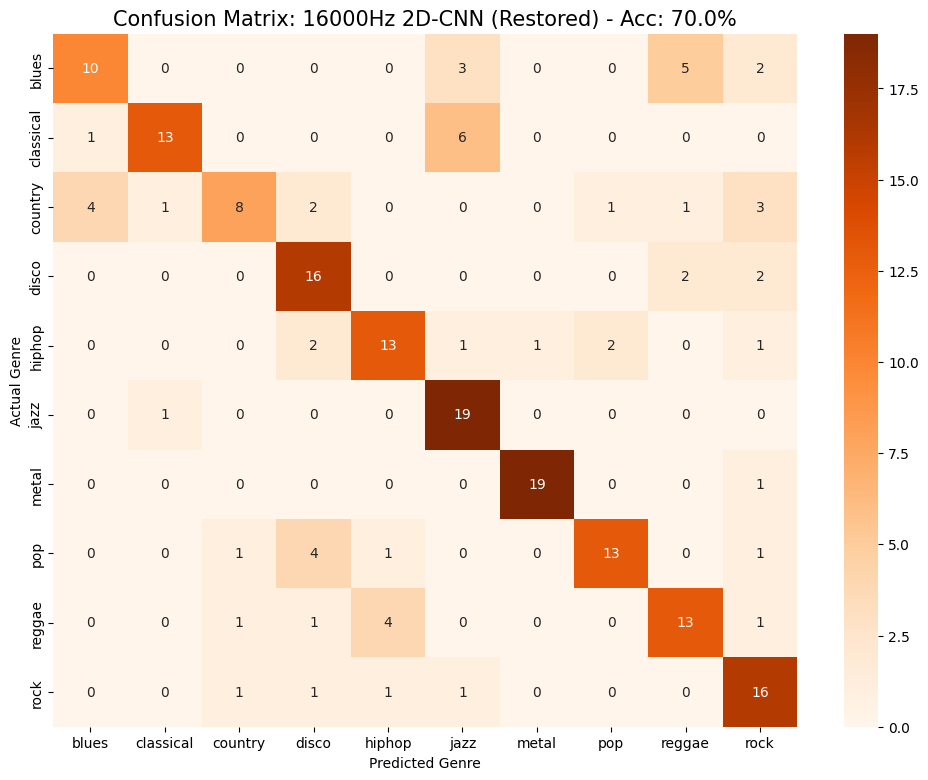

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. 評価モードに切り替え
model_res.eval()
all_p_res = []
all_l_res = []

print("### 16000Hz 復活版モデル：最終精度を計測中... ###")

with torch.no_grad():
    for mels, labels in test_loader_res:
        # モデルに入力して予測
        outputs = model_res(mels.to(device))
        _, predicted = torch.max(outputs, 1)

        all_p_res.extend(predicted.cpu().numpy())
        all_l_res.extend(labels.numpy())

# 2. Accuracyの算出
final_acc = np.mean(np.array(all_p_res) == np.array(all_l_res))

# 3. 結果の表示
print(f"\n" + "="*40)
print(f"  16000Hz 復活版 最終正解率: {final_acc*100:.2f}%")
print("="*40 + "\n")

print("### ジャンル別 詳細レポート ###")
# GENRESが定義されている前提です
print(classification_report(all_l_res, all_p_res, target_names=GENRES, zero_division=0))

# 4. 混同行列の描画
plt.figure(figsize=(12, 9))
cm = confusion_matrix(all_l_res, all_p_res)
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges', xticklabels=GENRES, yticklabels=GENRES)
plt.title(f"Confusion Matrix: 16000Hz 2D-CNN (Restored) - Acc: {final_acc*100:.1f}%", fontsize=15)
plt.xlabel("Predicted Genre")
plt.ylabel("Actual Genre")
plt.show()D